# **Tarea 3**: Espejismo de la Mayoría
**Asignatura**: MII797 - Ciencia de Redes

**Profesores**: Wenceslao Palma, Javier Vera

**Estudiante**: Máximo Arnao Molina

**Fecha de entrega**: 14 de Noviembre de 2020

## Parte 1: Sobre el *paper* "[*The "Majority Illusion" in Social Networks*](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0147617)"

### 1.a Resumen del *paper*

En una sociedad los individuos a menudo toman decisiones cotidianas como por ejemplo, qué producto comprar, comenzar a realizar un cierto deporte o escuchar un determinado grupo musical, estas elecciones regularmente están influenciadas fuertemente por los comportamientos adoptados por otras personas. Sin embargo, los individuos rara vez tienen un conocimiento global, es decir, de la sociedad en su conjunto, acerca de los comportamientos de los demás, sino que solo deben estimarlos a partir de las observaciones locales que realizan sobre sus contactos sociales más cercanos (amigos, familiares o conocidos). En este sentido la estructura de la red que representa a la sociedad, puede distorsionar significativamente las observaciones locales de cada individuo, lo que puede desencadenar en que un comportamiento que es globalmente raro y marginal en una sociedad, pueda estar sobrerepresentado en los vecindarios locales de muchos individuos. Este efecto denominado "ilusión de la mayoría", provoca que las personas sobrestimen un comportamiento que en realidad es minoritario. Esta investigación estudia este fenómeno presente en la topología de algunas redes, para ello se desarrolla un modelo estadístico para cuantificar este efecto tanto en redes sintéticas como del mundo real.

La estructura de la red puede distorsionar aún más las percepciones sociales al sesgar las observaciones individuales. Uno de estos sesgos de la red es la paradoja de la amistad, que establece que, en promedio, la mayoría de las personas tienen menos amigos que sus amigos. La paradoja de la amistad se ha utilizado, por ejemplo, para diseñar estrategias eficientes de vacunación, las que consisten en que en lugar de monitorear a personas al azar para detectar un brote contagioso, se monitorea a sus vecinos aleatorios, porque es más probable que ellos estén mejor conectados y no solo se enfermen antes, sino que también infecten a más personas que, en el pasado, ya se enfermaron.

Se describe una variación de la paradoja de la amistad, esta se aplica a las redes en las que los individuos tienen atributos, por ejemplo un caso simple en donde existe un atributo binario, como "tiene el pelo rojo" versus "no tiene el pelo rojo". Las personas con este atributo están marcadas como "activas" y al resto como "inactivas". Por lo que, en determinadas condiciones, muchos individuos observarán a la mayoría de sus vecinos en estado activo, incluso cuando sea globalmente raro. Ya que, aunque pocas personas tienen el pelo rojo, muchos pueden observar que la mayoría de sus amigos son pelirrojos. Por esta razón, se llama a este efecto la "ilusión de la mayoría".

En la investigacíon se usa el modelo de configuración, implementado por la biblioteca SNAP para crear una red scale-free con una secuencia de grados especificada. El modelo de configuración procedió uniendo un par de medias aristas elegidas al azar para formar una arista. Este procedimiento de enlace se repitió hasta que se agotaron todas las medias aristas o no hubo más formas de formar una arista. Para crear redes de tipo Erdös-Rényi, se comenzó con 10.000 nodos y pares enlazados al azar con alguna probabilidad fija. Estas probabilidades se eligieron para producir un grado promedio similar al grado promedio de las redes scale-free.

En redes asortativas, los nodos tienen una tendencia a enlazarse con nodos similares, por ejemplo, nodos de alto grado con otros nodos de alto grado. Por otro lado, en las redes desasortativas, los nodos prefieren enlazarse a nodos diferentes. Entonces para cambiar la asortividad de grados de una red se utiliza el procedimiento de intercambio de aristas de Newman y así no cambiar su distribución de grados. Este procedimiento de intercambio elige aleatoriamente dos pares de nodos conectados e intercambia sus aristas si al hacerlo cambia su correlación de grado. Esto se puede repetir hasta que se logre el grado de asortividad deseado.

Finalmente se demuestra que la paradoja es mucho más fuerte en redes desasortativas, donde los nodos de alto grado tienden a enlazarse con nodos de bajo grado. Ya que, dada la misma distribución de grados, los nodos de alto grado en una red desasortativa tendrán mayor poder para sesgar las observaciones de otros que los de una red asortativa. Esto sugiere que algunas estructuras de red son más susceptibles que otras a influir en la manipulación. Además, los pequeños cambios en la topología de la red, la asortividad de grados y la correlación atributo-grado pueden exacerbar aún más la paradoja incluso cuando no hay cambios reales en la distribución del atributo.

### 1.b Otro experimento para estudiar el espejismo de la mayoría

Siguiendo la misma lógica de nodos activos e inactivos, en lugar de analizar el vecindario de cada nodo de la red, se podrían evaluar las medidas de centralidad solo de los nodos activos y contrastarlas con la centralidad del resto de nodos y verificar que tan alta o sobre el promedio es la centralidad de aquellos nodos activos. Con esto, eventualmente, se podría inferir que si una gran cantidad de nodos activos además son muy centrales, los nodos inactivos de la red sufrirían el espejismo de la mayoría.

<span style="color:red"> 

- bien la redacción, solo pequeños errores.
- está interesante esta idea.
    
</span>


## Parte 2: Experimentos

### 2.a Construyendo redes Erdos-Renyi y Barabási-Albert

A continuación se construyen dos redes aleatorias, una siguiendo el modelo propuesto por Erdös-Rényi (ER) y la otra basada en el modelo de Barabási-Albert (BA). Ambas redes tienen `N = 500 nodos`. En el caso de la primera, la probabilidad de creación de una arista es `p = 2 * log(N)/N`. Para la segunda, el número de aristas para unir desde un nuevo nodo a los nodos existentes es `m = 0.5 * density * (N - 1)`, donde `density` es la densidad del primer grafo (Erdös-Rényi). Cabe destacar que estos valores fueron elegidos arbitrariamente.

<span style="color:red"> 

- ¿Qué fue elegido arbitrariamente?
    
</span>


In [82]:
import networkx as nx
import numpy as np

In [83]:
N = 500
p = 2 * np.log(N) / N

In [84]:
G_ER = nx.erdos_renyi_graph(N, p)

In [85]:
print('Valor de probabilidad \'p\':', p)
print('Número de componentes conexas:', nx.number_connected_components(G_ER))
print('Densidad:', nx.density(G_ER))

Valor de probabilidad 'p': 0.024858432393688765
Número de componentes conexas: 1
Densidad: 0.025306613226452907


In [86]:
import matplotlib.pyplot as plt

In [87]:
def plotG(G):
    fig, ax = plt.subplots(dpi = 800)
    pos = nx.kamada_kawai_layout(G) # nx.nx_pydot.graphviz_layout(G)

    nx.draw_networkx_nodes(G, pos, node_size = 10, node_color = 'salmon', node_shape = 'o', markeredgecolor = 'k', alpha = 0.95, fillstyle = 'full', linewidths = 0.1) 
    nx.draw_networkx_edges(G, pos, alpha = 0.5, width = 0.2, edge_color = 'k')

    plt.axis('off')
    plt.show()

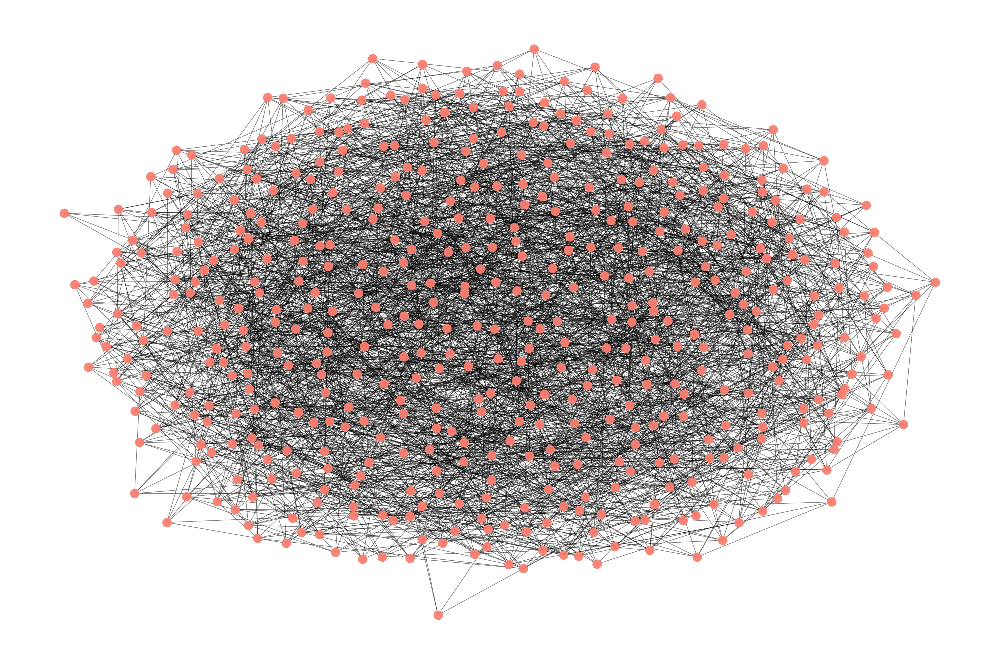

In [88]:
plotG(G_ER)

In [89]:
density = nx.density(G_ER) # Como referencia se usa la densidad del grafo ER
m = int(0.5 * density * (N - 1))
G_BA = nx.barabasi_albert_graph(N, m)

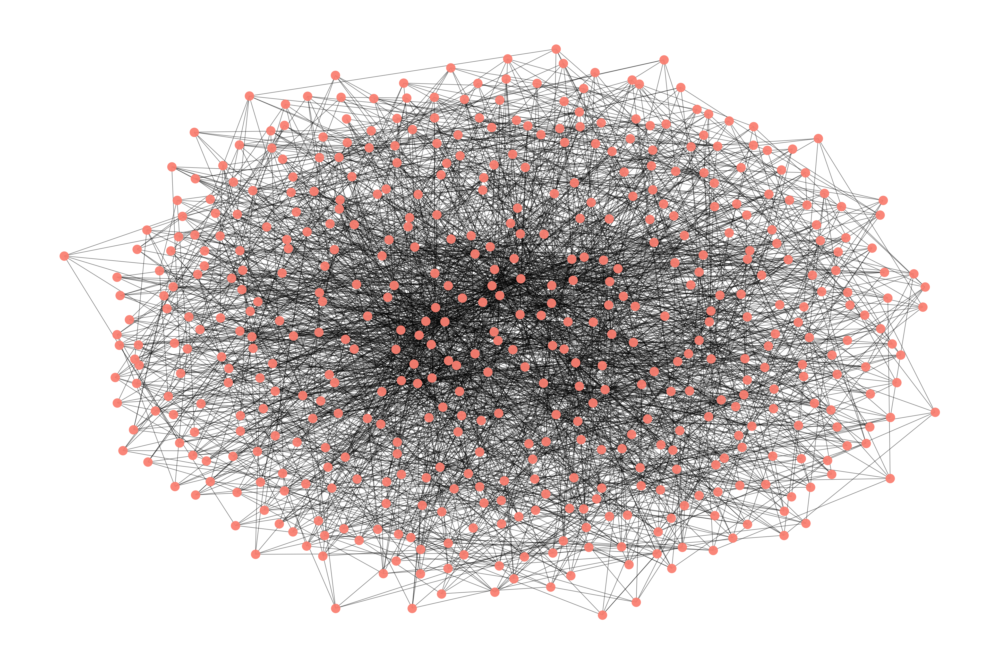

In [90]:
plotG(G_BA)

In [91]:
print('Valor de \'m\':', m)
print('Número de componentes conexas:', nx.number_connected_components(G_BA))
print('Densidad:', nx.density(G_BA))

Valor de 'm': 6
Número de componentes conexas: 1
Densidad: 0.023759519038076153


Como se puede observar en los datos de cada red, la de Erdös-Rényi tiene una densidad levemente superior (0.024) en comparación con la de Barabási-Albert (0.023). Se puede observar también que esta red cuenta con una densidad muy similar a la probabilidad `p` con la que fue creada. Por otra parte, ambas poseen solo una componente conexa.

### 2.b Calculando asortatividad y construyendo redes asortativas y disasortativas

A continuación, se calculan las asortatividades de cada red. Posteriormente se construyen dos versiones asortativas y disasortativas para ambas redes, para ello se utiliza el algoritmo presentado en el paper citado al comienzo. Este algoritmo consiste en eligir en cada iteración dos aristas al azar e intercambia las conexiones si `r` se hace mayor o menor, según si se quiere una red disasortativa o asortativa respectivamente.

In [92]:
print('Asortatividad de ER:', nx.degree_pearson_correlation_coefficient(G_ER))
print('Asortatividad de BA:', nx.degree_pearson_correlation_coefficient(G_BA))

Asortatividad de ER: 0.018164128963288395
Asortatividad de BA: -0.0372790352714481


In [93]:
def disassort(G):
    G_copy = G.copy()
    for i in range(1000):
        r = nx.degree_pearson_correlation_coefficient(G_copy)
        G0 = G_copy.copy()
        nx.connected_double_edge_swap(G0)
        r0 = nx.degree_pearson_correlation_coefficient(G0)
        if r > r0:
            #print(r0)
            G_copy = G0.copy()
    return G_copy

In [94]:
def assort(G):
    G_copy = G.copy()
    for i in range(1000):
        r = nx.degree_pearson_correlation_coefficient(G_copy)
        G0 = G_copy.copy()
        nx.connected_double_edge_swap(G0)
        r0 = nx.degree_pearson_correlation_coefficient(G0)
        if r < r0:
            #print(r0)
            G_copy = G0.copy()
    return G_copy

In [95]:
print('Procesando...')
G_ER_disassorts = [disassort(G_ER), disassort(G_ER)]
G_ER_assorts = [assort(G_ER), assort(G_ER)]
G_BA_disassorts = [disassort(G_BA), disassort(G_BA)]
G_BA_assorts = [assort(G_BA), assort(G_BA)]
print('Listo')

Procesando...
Listo


In [96]:
import pandas as pd

In [97]:
G_assortativities = {
    'Disasortativas': {
        'Erdos-Renyi (1)': nx.degree_pearson_correlation_coefficient(G_ER_disassorts[0]),
        'Erdos-Renyi (2)': nx.degree_pearson_correlation_coefficient(G_ER_disassorts[1]),
        'Barabasi-Albert (1)': nx.degree_pearson_correlation_coefficient(G_BA_disassorts[0]),
        'Barabasi-Albert (2)': nx.degree_pearson_correlation_coefficient(G_BA_disassorts[1]),
    },
    'Asortativas': {
        'Erdos-Renyi (1)': nx.degree_pearson_correlation_coefficient(G_ER_assorts[0]),
        'Erdos-Renyi (2)': nx.degree_pearson_correlation_coefficient(G_ER_assorts[1]),
        'Barabasi-Albert (1)': nx.degree_pearson_correlation_coefficient(G_BA_assorts[0]),
        'Barabasi-Albert (2)': nx.degree_pearson_correlation_coefficient(G_BA_assorts[1]),
    }
}

G_assortativities_df = pd.DataFrame.from_dict(G_assortativities)
G_assortativities_df

,Disasortativas,Asortativas
Erdos-Renyi (1),-0.127688,0.175067
Erdos-Renyi (2),-0.147313,0.182135
Barabasi-Albert (1),-0.148700,0.050091
Barabasi-Albert (2),-0.136086,0.056424


Como se puede observar, si bien las redes disasortativas resultantes poseen un grado de asortatividad similar, las redes asortativas de Erdös-Rényi tienen significativamente un mayor grado de asortatividad que las Barabási-Albert.

### 2.c Estableciendo nodos activos

A continuación, se establcen aleatoriamente nodos activos, para ello a partir de las 4 redes existentes se crean tres copias para cada una de estas, cada copia estará con el 1%, 5% y 10% de los nodos activos respectivamente. Esto con el fin de saber qué tan probable sea que un nodo elegido al azar sufra del efecto "ilusión de la mayoría".

In [98]:
for i in range(2):
    nx.set_node_attributes(G_ER_disassorts[i], False, 'is_active')
    nx.set_node_attributes(G_ER_assorts[i], False, 'is_active')
    nx.set_node_attributes(G_BA_disassorts[i], False, 'is_active')
    nx.set_node_attributes(G_BA_assorts[i], False, 'is_active')

In [99]:
import random
random.seed(10)

In [100]:
def activate_nodes(G, level):
    G_copy = G.copy()
    active_nodes = G_copy.number_of_nodes() * level # 0.05

    while active_nodes > 0:
        rand = random.randrange(0, G_copy.number_of_nodes() - 1)
        node = G_copy.nodes(data = True)[rand]
        if(node['is_active'] == False):
            node['is_active'] = True
            active_nodes -= 1
    
    return G_copy

In [101]:
G_ER_disassort_actives = {
    '0.01': [activate_nodes(G_ER_disassorts[0], 0.01), activate_nodes(G_ER_disassorts[1], 0.01)],
    '0.05': [activate_nodes(G_ER_disassorts[0], 0.05), activate_nodes(G_ER_disassorts[1], 0.05)],
    '0.1': [activate_nodes(G_ER_disassorts[0] , 0.1), activate_nodes(G_ER_disassorts[1], 0.1)]
}

G_ER_assort_actives = {
    '0.01': [activate_nodes(G_ER_assorts[0], 0.01), activate_nodes(G_ER_assorts[1], 0.01)],
    '0.05': [activate_nodes(G_ER_assorts[0], 0.05), activate_nodes(G_ER_assorts[1], 0.05)],
    '0.1': [activate_nodes(G_ER_assorts[0], 0.1), activate_nodes(G_ER_assorts[1], 0.1)]
}

G_BA_disassort_actives = {
    '0.01': [activate_nodes(G_BA_disassorts[0], 0.01), activate_nodes(G_BA_disassorts[1], 0.01)],
    '0.05': [activate_nodes(G_BA_disassorts[0], 0.05), activate_nodes(G_BA_disassorts[1], 0.05)],
    '0.1': [activate_nodes(G_BA_disassorts[0] , 0.1), activate_nodes(G_BA_disassorts[1], 0.1)]
}

G_BA_assort_actives = {
    '0.01': [activate_nodes(G_BA_assorts[0], 0.01), activate_nodes(G_BA_assorts[1], 0.01)],
    '0.05': [activate_nodes(G_BA_assorts[0], 0.05), activate_nodes(G_BA_assorts[1], 0.05)],
    '0.1': [activate_nodes(G_BA_assorts[0], 0.1), activate_nodes(G_BA_assorts[1], 0.1)]
}

### 2.d Calculando el número de vecinos activos que percibe cada nodo

A continuación, se calcula el número de vecinos activos que percibe cada nodo, para luego obtener el porcentaje de vecinos activos del nodo, promediarlos y así obtener el promedio de vecinos activos que percibirán los nodos de una red.

In [102]:
def calculate_perception_avg(G):
    percentages = []
    for node in G.nodes():
        neighbors = list(nx.neighbors(G, node))
        total_neighbors = len(neighbors)
        active_neighbor_count = 0
        
        for neighbor in neighbors:
            neighbor_data = G.nodes()[neighbor]
            if(neighbor_data['is_active']):
                active_neighbor_count += 1
        
        percentages.append(active_neighbor_count / total_neighbors)
    
    return sum(percentages) / G.number_of_nodes()

In [158]:
G_assortativities_perception = np.array([
    [
        'Erdos-Renyi (1)', 'Disasortativa', G_assortativities['Disasortativas']['Erdos-Renyi (1)'],
        '0.01', calculate_perception_avg(G_ER_disassort_actives['0.01'][0])
    ],
    [
        'Erdos-Renyi (2)', 'Disasortativa', G_assortativities['Disasortativas']['Erdos-Renyi (2)'],
        '0.01', calculate_perception_avg(G_ER_disassort_actives['0.01'][1])
    ],
    [
        'Erdos-Renyi (1)', 'Disasortativa', G_assortativities['Disasortativas']['Erdos-Renyi (1)'],
        '0.05', calculate_perception_avg(G_ER_disassort_actives['0.05'][0])
    ],
    [
        'Erdos-Renyi (2)', 'Disasortativa', G_assortativities['Disasortativas']['Erdos-Renyi (2)'],
        '0.05', calculate_perception_avg(G_ER_disassort_actives['0.05'][1])
    ],
    [
        'Erdos-Renyi (1)', 'Disasortativa', G_assortativities['Disasortativas']['Erdos-Renyi (1)'],
        '0.1', calculate_perception_avg(G_ER_disassort_actives['0.1'][0])
    ],
    [
        'Erdos-Renyi (2)', 'Disasortativa', G_assortativities['Disasortativas']['Erdos-Renyi (2)'],
        '0.1', calculate_perception_avg(G_ER_disassort_actives['0.1'][1])
    ],
    [
        'Erdos-Renyi (1)', 'Asortativa', G_assortativities['Asortativas']['Erdos-Renyi (1)'],
        '0.01', calculate_perception_avg(G_ER_assort_actives['0.01'][0])
    ],
    [
        'Erdos-Renyi (2)', 'Asortativa', G_assortativities['Asortativas']['Erdos-Renyi (2)'],
        '0.01', calculate_perception_avg(G_ER_assort_actives['0.01'][1])
    ],
    [
        'Erdos-Renyi (1)', 'Asortativa', G_assortativities['Asortativas']['Erdos-Renyi (1)'],
        '0.05', calculate_perception_avg(G_ER_assort_actives['0.05'][0])
    ],
    [
        'Erdos-Renyi (2)', 'Asortativa', G_assortativities['Asortativas']['Erdos-Renyi (2)'],
        '0.05', calculate_perception_avg(G_ER_assort_actives['0.05'][1])
    ],
    [
        'Erdos-Renyi (1)', 'Asortativa', G_assortativities['Asortativas']['Erdos-Renyi (1)'],
        '0.1', calculate_perception_avg(G_ER_assort_actives['0.1'][0])
    ],
    [
        'Erdos-Renyi (2)', 'Asortativa', G_assortativities['Asortativas']['Erdos-Renyi (2)'],
        '0.1', calculate_perception_avg(G_ER_assort_actives['0.1'][1])
    ],
    [
        'Barabasi-Albert (1)', 'Disasortativa', G_assortativities['Disasortativas']['Barabasi-Albert (1)'],
        '0.01', calculate_perception_avg(G_BA_disassort_actives['0.01'][0])
    ],
    [
        'Barabasi-Albert (2)', 'Disasortativa', G_assortativities['Disasortativas']['Barabasi-Albert (2)'],
        '0.01', calculate_perception_avg(G_BA_disassort_actives['0.01'][1])
    ],
    [
        'Barabasi-Albert (1)', 'Disasortativa', G_assortativities['Disasortativas']['Barabasi-Albert (1)'],
        '0.05', calculate_perception_avg(G_BA_disassort_actives['0.05'][0])
    ],
    [
        'Barabasi-Albert (2)', 'Disasortativa', G_assortativities['Disasortativas']['Barabasi-Albert (2)'],
        '0.05', calculate_perception_avg(G_BA_disassort_actives['0.05'][1])
    ],
    [
        'Barabasi-Albert (1)', 'Disasortativa', G_assortativities['Disasortativas']['Barabasi-Albert (1)'],
        '0.1', calculate_perception_avg(G_BA_disassort_actives['0.1'][0])
    ],
    [
        'Barabasi-Albert (2)', 'Disasortativa', G_assortativities['Disasortativas']['Barabasi-Albert (2)'],
        '0.1', calculate_perception_avg(G_BA_disassort_actives['0.1'][1])
    ],
    [
        'Barabasi-Albert (1)', 'Asortativa', G_assortativities['Asortativas']['Barabasi-Albert (1)'],
        '0.01', calculate_perception_avg(G_BA_assort_actives['0.01'][0])
    ],
    [
        'Barabasi-Albert (2)', 'Asortativa', G_assortativities['Asortativas']['Barabasi-Albert (2)'],
        '0.01', calculate_perception_avg(G_BA_assort_actives['0.01'][1])
    ],
    [
        'Barabasi-Albert (1)', 'Asortativa', G_assortativities['Asortativas']['Barabasi-Albert (1)'],
        '0.05', calculate_perception_avg(G_BA_assort_actives['0.05'][0])
    ],
    [
        'Barabasi-Albert (2)', 'Asortativa', G_assortativities['Asortativas']['Barabasi-Albert (2)'],
        '0.05', calculate_perception_avg(G_BA_assort_actives['0.05'][1])
    ],
    [
        'Barabasi-Albert (1)', 'Asortativa', G_assortativities['Asortativas']['Barabasi-Albert (1)'],
        '0.1', calculate_perception_avg(G_BA_assort_actives['0.1'][0])
    ],
    [
        'Barabasi-Albert (2)', 'Asortativa', G_assortativities['Asortativas']['Barabasi-Albert (2)'],
        '0.1', calculate_perception_avg(G_BA_assort_actives['0.1'][1])
    ]
])

columns = ['Nombre ID', 'Tipo', 'r', 'Nivel', 'A']
G_assortativities_perception_df = pd.DataFrame(G_assortativities_perception, columns = columns)
#G_assortativities_perception_df.sort_values(['A', 'Nivel'], ascending = False)
G_assortativities_perception_df.sort_values(['A', 'r'], ascending = False)

,Nombre ID,Tipo,r,Nivel,A
23,Barabasi-Albert (2),Asortativa,0.05642406816268934,0.1,0.12419468604080944
4,Erdos-Renyi (1),Disasortativa,-0.12768794914811704,0.1,0.10171307842148161
5,Erdos-Renyi (2),Disasortativa,-0.1473130081179781,0.1,0.10167408900831319
11,Erdos-Renyi (2),Asortativa,0.18213538280676853,0.1,0.1006595502017466
10,Erdos-Renyi (1),Asortativa,0.17506744696490026,0.1,0.09833159468931814
17,Barabasi-Albert (2),Disasortativa,-0.1360861619771649,0.1,0.09797977050831413
22,Barabasi-Albert (1),Asortativa,0.05009098540757881,0.1,0.09748160048140522
16,Barabasi-Albert (1),Disasortativa,-0.1486998187911308,0.1,0.08935986649082209
2,Erdos-Renyi (1),Disasortativa,-0.12768794914811704,0.05,0.05205718967396846
9,Erdos-Renyi (2),Asortativa,0.18213538280676853,0.05,0.05117461082089561


De la tabla anterior se puede destacar que al ordenar por promedio de vecinos activos y grado de asortatividad, los niveles aparecerán igualmente de mayor a menor, lo cual tiene sentido considerando que a mayor cantidad de nodos activos, mayor será el promedio de percepción de vecinos activos. Sin embargo, no se logra apreciar una relación entre el promedio de percepción con el grado de asortatividad.

<span style="color:red"> 

- falta profundizar más en la interpretación de tus resultados.
    
</span>
